# **Procesamiento de registros correspondientes al 2021**

### **Elementos necesarios para la importación**
---

Montaje del drive personal



In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Importación de librerias necesarias para el manejo de la señal

In [ ]:
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
import pandas as pd 
import os
from scipy import stats
!pip install pingouin
import pingouin as pg
from os import listdir
from os.path import isfile, join
import io

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 185 kB 38.3 MB/s 
     |████████████████████████████████| 9.9 MB 64.8 MB/s 
  Created wheel for pingouin: filename=pingouin-0.5.2-py3-none-any.whl size=196208 sha256=335545a48a8b0bc1cd873b5031971259161d0706ab971a5695a715c8059d5659
  Stored in directory: /root/.cache/pip/wheels/11/5a/63/a6d32fc26fa462c731f65480bfb98ff7bd39b8ebcb4bc6c2fe
  Created wheel for littleutils: filename=littleutils-0.2.2-py3-none-any.whl size=7049 sha256=4a72e34bda784d31dcafecaa097dd048c1520cffa68326519a7869cb3438da1b
  Stored in directory: /root/.cache/pip/wheels/d6/64/cd/32819b511a488e4993f2fab909a95330289c3f4e0f6ef4676d
Successfully built pingouin littleutils
  Attempting uninstall: statsmodels
    Found existing installation: statsmodels 0.12.2
    Uninstalling statsmodels-0.12.2:
      Successfully uninstalled statsmodels-0.12.2


In [ ]:
!pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Se descomprime un paquete de filtros alojado en el drive personal

In [5]:
!unzip '/content/drive/MyDrive/Visión Sábados/Codigos/Librerias/librerias.zip'

Archive:  /content/drive/MyDrive/Visión Sábados/Codigos/Librerias/librerias.zip
  inflating: linearFIR.py            
   creating: __MACOSX/
  inflating: __MACOSX/._linearFIR.py  
   creating: chronux/
   creating: chronux/__pycache__/
  inflating: chronux/__pycache__/qeeg_psd_chronux.cpython-37.pyc  
   creating: __MACOSX/chronux/
   creating: __MACOSX/chronux/__pycache__/
  inflating: __MACOSX/chronux/__pycache__/._qeeg_psd_chronux.cpython-37.pyc  
  inflating: chronux/__pycache__/mtspectrumc.cpython-37.pyc  
  inflating: __MACOSX/chronux/__pycache__/._mtspectrumc.cpython-37.pyc  
  inflating: __MACOSX/chronux/.___pycache__  
  inflating: chronux/README.md       
  inflating: __MACOSX/chronux/._README.md  
  inflating: chronux/requires.txt    
  inflating: __MACOSX/chronux/._requires.txt  
  inflating: chronux/implementation.py  
  inflating: __MACOSX/chronux/._implementation.py  
  inflating: chronux/qeeg_psd_chronux.py  
  inflating: __MACOSX/chronux/._qeeg_psd_chronux.py  
  inf

Se importan las librerias que estan contenidas en el archivo .zip

In [6]:
from linearFIR import filter_design, mfreqz
from wavelet_filtering import wnoisest, wthresh, thselect
from chronux.qeeg_psd_chronux import qeeg_psd_chronux, mtspectrumc
!pip install PyWavelets
import pywt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Ruta donde se encuentran las señales que se importarán *path* y donde serán guardadas

In [7]:
path = r'/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Registros/Group 6'

Se crean los nombres de los archivos y se disenan los filtros lineales

2.0
pop_eegfiltnew() - cutoff frequency(ies) (-6 dB): [2.] Hz



/content/linearFIR.py:73: RuntimeWarning: divide by zero encountered in log10
  h_dB = 20 * np.log10 (abs(h));


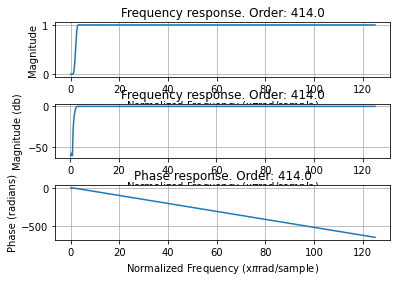

11.25
pop_eegfiltnew() - cutoff frequency(ies) (-6 dB): [50.625] Hz



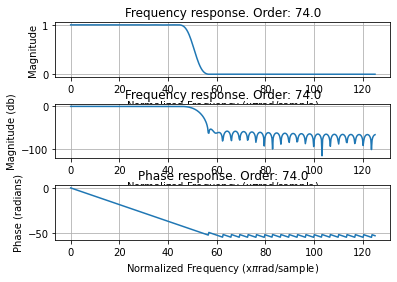

In [8]:
electrodes = ['FCz','Oz','O1','PO7','O2','PO8','PO3','PO4'] # Electrodes used in the recording

fs = 250 # Sampling frecuency

low_fre = 3 # Low cut frecuency

high_fre = 45 # High cut frecuency

num_logmars = 7 # Number of logmars evaluated

# Filters design

order, highpass = filter_design(fs, locutoff = low_fre, hicutoff = 0, revfilt = 1)

mfreqz(highpass,1,order, fs/2)

order, lowpass = filter_design(fs, locutoff = 0, hicutoff = high_fre, revfilt = 0)

mfreqz(lowpass,1,order, fs/2)




In [9]:
def scalogram(signal, sampling_frequency, frequency_band, path):

  sampling_period =  1/sampling_frequency
  Frequency_Band = frequency_band #Corresponde a la banda de frecuencia a analizar [4, 13]

  # Métodos de obtener las escalas para el Complex Morlet Wavelet  
  # Método 1:
  # Determinar las frecuencias respectivas para una escalas definidas
  scales = np.arange(1, 250)
  frequencies = pywt.scale2frequency('cmor1.0-1.0', scales)/sampling_period
  # Extraer las escalas correspondientes a la banda de frecuencia a analizar
  scales = scales[np.where(frequencies >= Frequency_Band[0]) and np.where(frequencies <= Frequency_Band[1])] 

  points = signal.shape[0]

  #%%
  # Obtener el tiempo correspondiente a una epoca de la señal (en segundos)
  time_epoch = sampling_period*points

  # Analizar una epoca de un montaje (con las escalas del método 1)
  # Obtener el vector de tiempo adecuado para una epoca de un montaje de la señal
  time = np.arange(0, time_epoch, sampling_period)
  # Para la primera epoca del segundo montaje calcular la transformada continua de Wavelet, usando Complex Morlet Wavelet

  [coef, freqs] = pywt.cwt(signal, scales, 'cmor1.0-1.0', sampling_period)
  # Calcular la potencia 
  power = (np.abs(coef)) ** 2
  # Graficar el escalograma obtenido del análisis tiempo frecuencia
  f, ax = plt.subplots(figsize=(15, 10))
  scalogram = ax.contourf(time,
                  freqs,
                  power,
                  10, # Especificar 20 divisiones en las escalas de color 
                  extend='both')
  ax.set_ylim(np.amin(freqs), np.amax(freqs))
  ax.set_ylabel('frequency [Hz]')
  ax.set_xlabel('Time [s]')
  cbar = plt.colorbar(scalogram)

  # CAUTION! this code Always overwrites the plots
  
  #plt.savefig(path + '_spectrum.png')
  #plt.show()
 

### **Función para la carga de la señal**

---

In [10]:
def signal_upload(signal_path, subject, eye, electrodes):

  '''
  Function created to upload a signal from a csv file to the enviroment of 
  work, saving it in a pandas DataFrame and then in a numpy array. In this 
  function, to all the channels is substracted Fcz channel that works as 
  a reference. Then the raw signal is plotted.

  Input: signal_path --> str (path where the csv file is located with the data)

         subject --> str (code of identification of the subject)

         eye --> str (signal that will be uploaded ej. both_eyes, left or right)

         electrodes --> list (contains the names of the electrodes used in the recording)
         

  Output: vision_signal --> Numpy array (array with the uploaded signal)

          signals_marks --> Numpy array (array where the marks are located)
  '''

  vision_signal = pd.read_csv(signal_path, index_col=False, header = None, sep = ';')

  signal_marks = vision_signal.iloc[:,8].to_numpy()

  vision_signal = vision_signal.iloc[:,0:8]

  vision_signal = vision_signal.to_numpy()

  OpenBCI_factor = ((4500000)/24/(2**23-1)) #Factor reported in OpenBCI documentation

  vision_signal = vision_signal*OpenBCI_factor

  vision_signal = vision_signal - np.repeat(vision_signal[:,0,np.newaxis],8,1)

  vision_signal = vision_signal[:,1:]

  num_channels = vision_signal.shape[1]

  plt.figure(figsize=(12,5))

  for c in range(num_channels):

    plt.title(" Raw signal of " + subject +" "+ eye )

    plt.plot(vision_signal[:,c] + 1*c,label = electrodes[c+1])

    plt.grid()

    plt.legend(loc = 4)

  plt.show()

  return vision_signal, signal_marks

### **Función para realiza el filtrado de la señal y visualización**

---

In [11]:
def signal_filtering(uploaded_signal, subject, eye, electrodes, highpass, lowpass):

  '''
  Function that filters the signal. First, linear tendences are eliminated. Then,
  using designed linear filters (highpass and lowpass) the function defines
  a range of frecuencies. Last, using a non-linear filter (wavelet) the signal
  is filtrated again and plots the result.

  Inputs: uploaded_signal --> Numpy array (signal to be filtered)

          subject --> str (code of identification of the subject)

          eye --> str (signal that will be uploaded ej. both_eyes, left or right)

          electrodes --> list (contains the names of the electrodes used in the recording)

          highpass --> Numpy array (highpass filter)

          lowpass --> Numpy array (lowpass filter)


  Output: filtered signal --> Numpy array (resulting signal of the filtering process)
  '''


  vision_signal = signal.detrend(uploaded_signal, axis=0, type='linear')

  num_channels = vision_signal.shape[1]

  filtered_signal = np.zeros((len(vision_signal), num_channels))

  for c in range(num_channels):

    LL_ind = int(np.floor(np.log2(vision_signal[:,c].shape[0])))

    coeff_ind = pywt.wavedec(vision_signal[:,c], 'db6', level=8)

    thr = thselect(coeff_ind)

    s = wnoisest(coeff_ind)

    coeff_t = wthresh(coeff_ind,thr,s)

    x_rec = pywt.waverec(coeff_t, 'db6')

    resta = vision_signal[:,c] - x_rec[:len(vision_signal)]

    senal_w_hp = signal.filtfilt(highpass, 1, resta)

    senal_filt = signal.filtfilt(lowpass, 1, senal_w_hp)

    filtered_signal[:,c] = senal_filt

  plt.figure(figsize=(12,5))

  for c in range(num_channels):

    plt.title(" Filtered signal of "+ subject + " " + eye)

    plt.plot(filtered_signal[:,c] + 100*c,label = electrodes[c+1])

    plt.legend(loc = 4)

    plt.grid()

  plt.show()

  return filtered_signal

### **Función para visualización del periodograma y ejecución del escalograma (visualización de periodograma y espectro)**

---

In [12]:
def periodogram(signal_filtered, marks, num_logmars, sampling_frecuency, subject,acuity_signals, signal_path):

  '''
  Funtion to obtain the periodogram of each logmar for each signal using Welch
  technique, then, it is plotted and saved.

  Inputs: signal_filtered --> Numpy array (signal to be used to find the periodogram)

          marks --> Numpy array (array with the same length of the signal that
                    contains the marks)

          num_logmars --> int (talking about visual acuity, the number of logmar
                                that had been evaluated in the recording ej. 7)

          sampling_frecuency --> int (sampling frecuency of the EEG recorder)

          subject --> str (code of identification of the subject)

          eye --> str (signal that will be uploaded ej. both_eyes, left or right)

          signal_path --> str (path where the plots will be saved)

  '''
  path_save = signal_path[0:len(signal_path)-4]
  fs = sampling_frecuency
  SNR_counter = 0 # Counter for signals that have SNR > 1
  harmonics_SNRCounter = 0 # Counter for signals that have SNR > 1 in the first harmonic of the stimulation frequency
  SNR_subject = []

  if not os.path.exists(path_save):
    os.makedirs(path_save)
  index = np.where( marks != 0.0)
  mark = index[0].tolist()
  
  if mark:
    f, Pxx = signal.welch( signal_filtered[mark[0]:mark[1],0], sampling_frecuency, nperseg = 2 * sampling_frecuency, noverlap = sampling_frecuency, nfft=None, return_onesided=True)
    stimulation_freq = 5
    prom = ( Pxx[(2*stimulation_freq)-1] + Pxx[(2*stimulation_freq+1)] )/2
    harmonic_prom = ( Pxx[(4*stimulation_freq)-1] + Pxx[(4*stimulation_freq+1)] )/2
    SNR = Pxx[(2*stimulation_freq)] / prom
    harmonic_SNR = Pxx[(4*stimulation_freq)] / harmonic_prom
    SNR_subject.append(SNR)
    if SNR > 1:
      SNR_counter += 1
      if harmonic_SNR > 1:
        harmonics_SNRCounter += 1
  else:
    f, Pxx = signal.welch( signal_filtered[:,0], sampling_frecuency, nperseg = 2 * sampling_frecuency, noverlap = sampling_frecuency, nfft=None, return_onesided=True)
    SNR = np.nan
    SNR_subject.append(SNR)

  return Pxx, SNR_counter, harmonics_SNRCounter, SNR_subject 

### **Búsqueda de señales en el directorio**
---

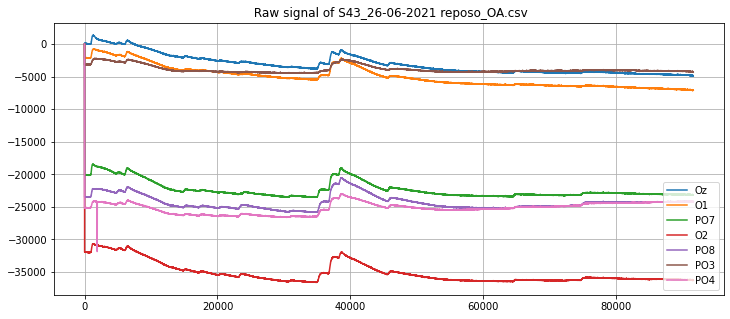

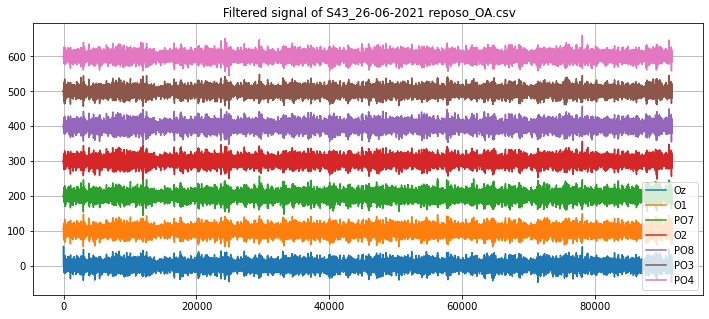

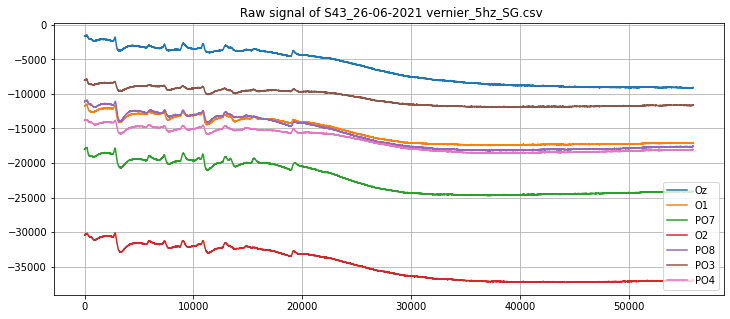

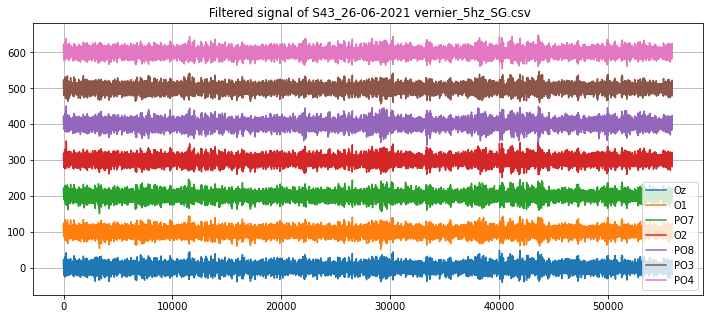

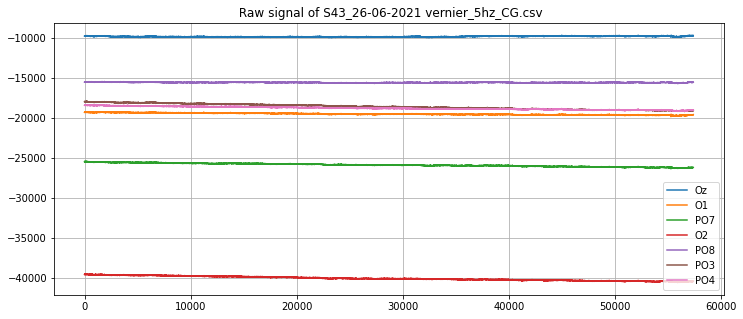

...

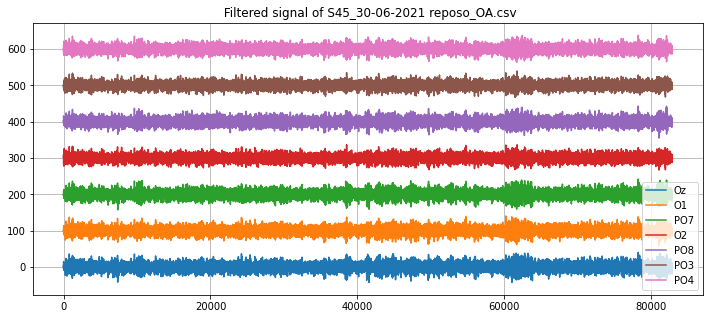

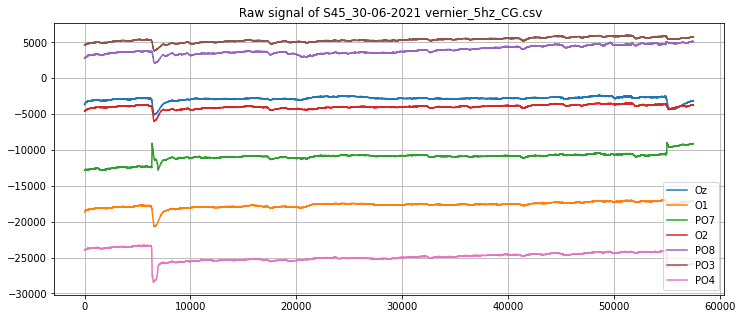

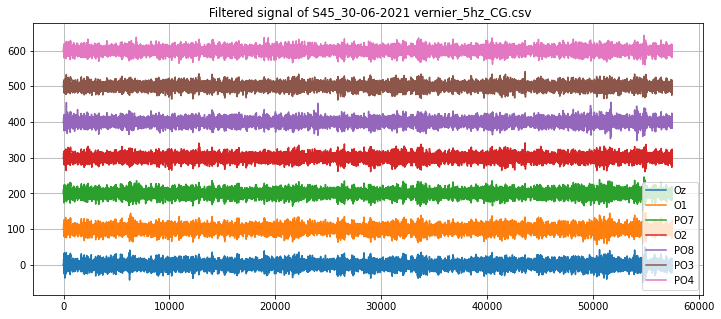

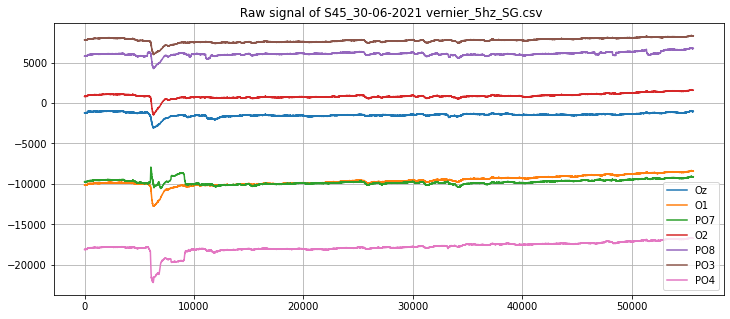

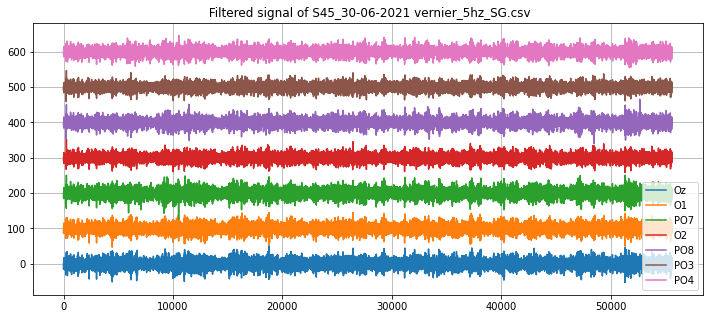

In [13]:
#Codigo para controles (que tienen gafas)
signals_WSNR = 0
signals_WHarmonic_SNR = 0
SNR_CG = []
SNR_SG=[]
l_r=[]
controles_CG=[]
controles_SG=[]
path=r'/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Registros/Controles_congafas'
for group in os.listdir(path):
  for subject in os.listdir(os.path.join(path, group)):
    for acuity_signals in os.listdir(os.path.join(path, group, subject)):
      if acuity_signals=="vernier_5hz_SG.csv":
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        controles_SG.append(Pot)
        SNR_SG.append(SNR_subject)
      
      if acuity_signals=="vernier_5hz_CG.csv":
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        controles_CG.append(Pot)
        SNR_CG.append(SNR_subject)
            
      if acuity_signals=="reposo_OA.csv" or acuity_signals=="reposo.csv":
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        l_r.append(Pot)



df_reposo_controles = pd.DataFrame(l_r,columns=np.arange(0,125.5,.5))
df_controles_CG = pd.DataFrame(controles_CG,columns=np.arange(0,125.5,.5))
df_controles_SG=pd.DataFrame(controles_SG,columns=np.arange(0,125.5,.5))
df_controles_CG.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_CG.csv',sep=',',index=False)
df_controles_SG.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_SG.csv',sep=',',index=False)
df_reposo_controles.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_reposo_controles.csv',sep=',',index=False)

            W      pval  normal
5.0  0.702133  0.000015   False
            W      pval  normal
5.0  0.647588  0.000003   False
Resultados Prueba
Se obtuvo un estadistico de 63.0 con un valor p de 0.021372318267822266


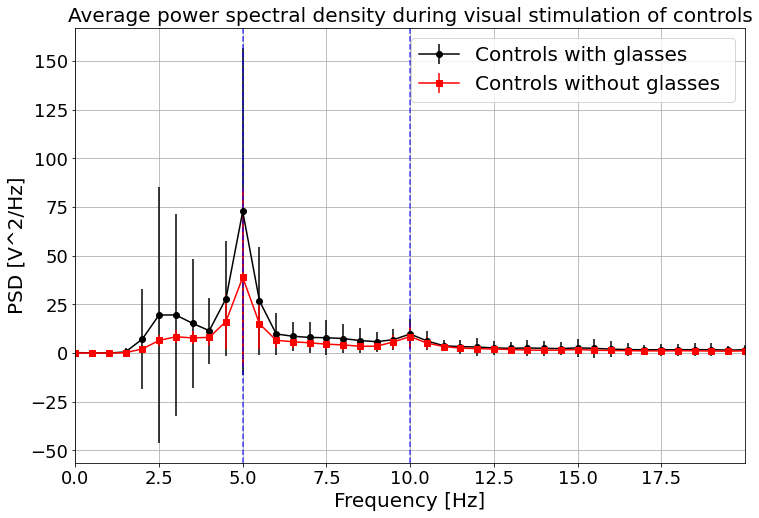

SNR controles con gafas
           0
0   3.328527
1   1.533979
2   3.102179
3   3.020970
4   2.507764
5   3.038502
6   2.631811
7   2.246708
8   1.076114
9   3.138334
10  2.440861
11  1.910149
12  2.699698
13  2.537968
14  3.346899
15  2.846253
16  3.008282
17  2.026887
18  1.978588
19  3.185076
20  3.114048
21  1.799885
22  1.774322

SNR controles sin gafas
           0
0   0.953865
1   0.767203
2   2.221024
3   3.366826
4   2.315101
5   3.353002
6   2.247036
7   1.901775
8   2.143942
9   1.289979
10  2.610970
11  1.808595
12  2.944214
13  2.389185
14  2.430126
15  3.044209
16  2.810472
17  1.718250
18  1.892721
19  2.466651
20  2.654963
21  1.334469
22  1.054879


<Figure size 432x288 with 0 Axes>

In [16]:
##ii) Con gafas vs Sin Gafas (prueba t no paramétrica pareada en el valor del pico): La gente que usa lentes cuando no los tiene
## puestos ve diferentes los estímulos y eso se ve reflejado en el pico. La aparición del pico no es fortuita
#Nota: estos son los datos de interes para estas pruebas df_controles_CG['5.0'] y df_controles_SG['5.0']


df_controles_CG=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_CG.csv') 
df_controles_SG=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_SG.csv')
img_path = '/content/drive/MyDrive/Visión Sábados/CG_SG.tiff'
#Prueba T


print(pg.normality(data=df_controles_CG['5.0']))
print(pg.normality(data=df_controles_SG['5.0']))
print("Resultados Prueba")

# Prueba T no paramétrica pareada 
# Hipotesis nula: tienen distribuciones iguales
# Se realiza Wilcoxon para muestras pareadas
from scipy.stats import wilcoxon
# Según ambas pruebas hay diferencias en los grupos
u,pvalue = wilcoxon(df_controles_CG['5.0'], df_controles_SG['5.0'])
print(f'Se obtuvo un estadistico de {u} con un valor p de {pvalue}')

#Grafico
CG = df_controles_CG.mean(axis = 0).values
SG = df_controles_SG.mean(axis = 0).values

plt.figure(figsize = (12,8))
plt.xlim([0,40])
plt.xticks(np.arange(0,40,5))
plt.errorbar(df_controles_CG.columns, CG, xerr=None, yerr=df_controles_CG.std(axis = 0).values,  color = 'black', marker='o')
plt.errorbar(df_controles_SG.columns, SG,  xerr=None, yerr=df_controles_SG.std(axis = 0).values, color = 'red', marker='s')
plt.legend(['Controls with glasses ','Controls without glasses '],fontsize=20)
plt.axvline(10, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)
plt.axvline(20, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)

plt.grid()
plt.xlabel('Frequency [Hz]',fontsize=20)
plt.ylabel('PSD [V^2/Hz]',fontsize=20)
plt.title('Average power spectral density during visual stimulation of controls',fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()
plt.savefig(img_path)
#SNR
SNR_CG = pd.DataFrame(SNR_CG)
SNR_SG=pd.DataFrame(SNR_SG)
print('SNR controles con gafas')
print(SNR_CG)
print('\nSNR controles sin gafas')
print(SNR_SG)

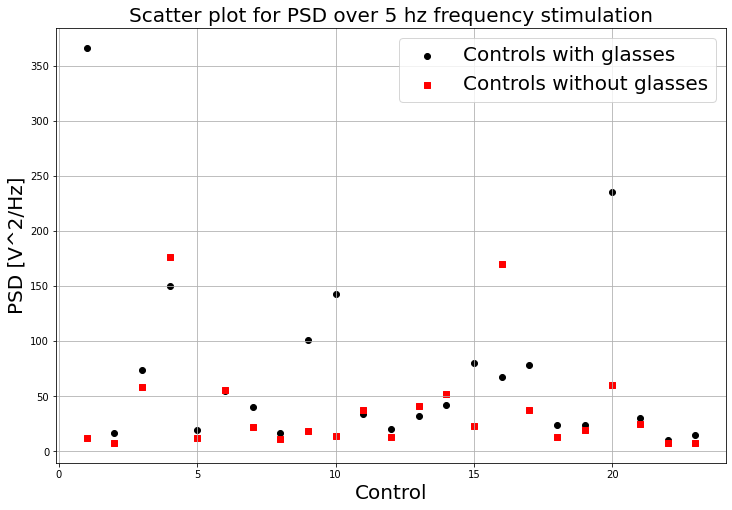

In [ ]:
# Gráficos de dispersión

colors = ['black','red']
g1 = df_controles_CG['5.0']
g2 = df_controles_SG['5.0']

plt.figure(figsize = (12,8))
plt.scatter(range(1,len(g1)+1), g1,marker='o', color='black')
plt.scatter(range(1,len(g2)+1), g2, marker='s', c='red')
plt.title('Scatter plot for PSD over 5 hz frequency stimulation', fontsize=20)
plt.legend(['Controls with glasses', 'Controls without glasses'], fontsize=20)
plt.xlabel('Control', fontsize=20)
plt.ylabel('PSD [V^2/Hz]', fontsize=20)
plt.grid()

In [ ]:
# LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
LDA_classifier = LinearDiscriminantAnalysis()

# data 

x_1 = np.reshape(df_controles_CG['5.0'].values, (len(df_controles_CG['5.0'].values),1))
y_1 = np.ones((len(x_1),))
x_2 = np.reshape(df_controles_SG['5.0'].values, (len(df_controles_SG['5.0'].values),1))
y_2 = np.zeros((len(x_2),))
X = np.concatenate((x_1, x_2))
Y = np.concatenate((y_1, y_2))

# Se separan los datos de entrenamiento

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size=0.7)

# Entrenamiento

LDA_classifier.fit(X_train, Y_train)
LDA_classifier.score(X_test, Y_test)

0.42857142857142855

Controles
S49_1-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz_CG.csv', 'ajedrez_6hz_CG.csv', 'vernier_5hz_CG.csv', 'vernier_6hz_CG.csv', 'ajedrez_5hz_SG.csv', 'ajedrez_6hz_SG.csv', 'vernier_5hz_SG.csv', 'vernier_6hz_SG.csv', 'reposo_OA', 'vernier_5hz_CG', 'vernier_5hz_SG']
1


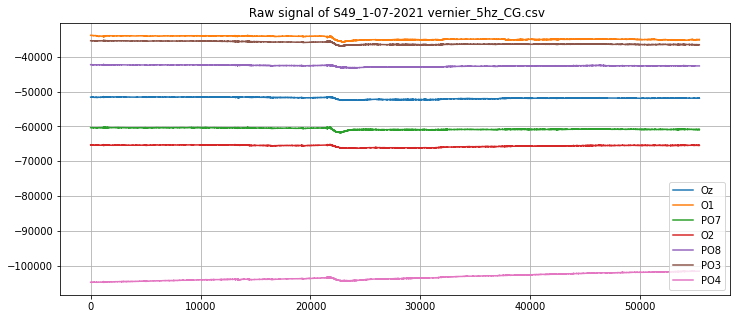

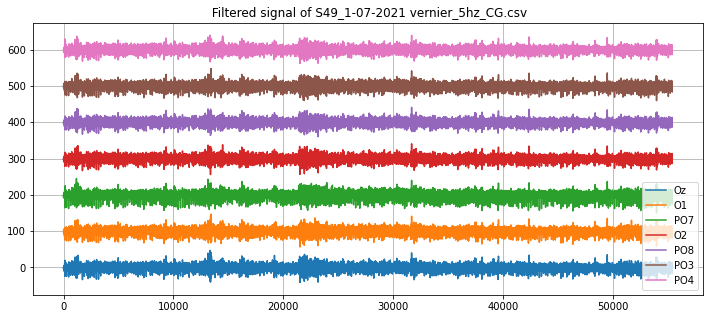

Controles
S47_30-06-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz_SG.csv', 'ajedrez_6hz_SG.csv', 'vernier_5hz_SG.csv', 'vernier_6hz_SG.csv', 'ajedrez_5hz_CG.csv', 'ajedrez_6hz_CG.csv', 'vernier_5hz_CG.csv', 'vernier_6hz_CG.csv', 'reposo_OA', 'vernier_5hz_SG', 'vernier_5hz_CG']
2


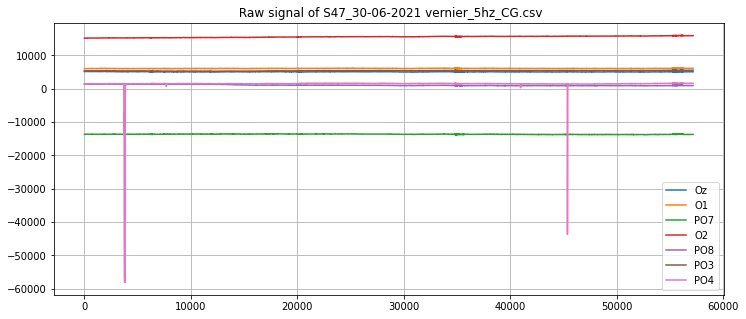

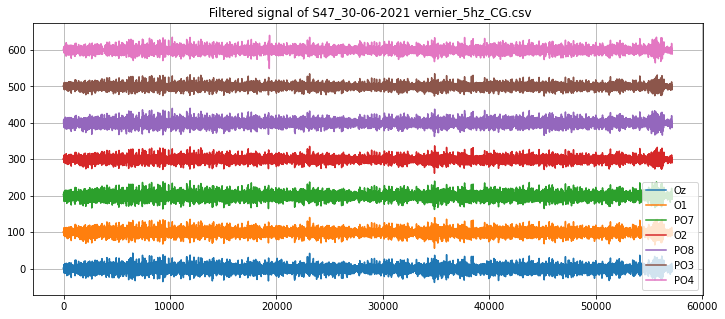

Controles
S26_09-06-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz_CG.csv', 'ajedrez_6hz_CG.csv', 'vernier_5hz_CG.csv', 'vernier_6hz_CG.csv', 'ajedrez_5hz_SG.csv', 'ajedrez_6hz_SG.csv', 'vernier_5hz_SG.csv', 'vernier_6hz_SG.csv', 'vernier_5hz_SG', 'reposo_OA', 'vernier_5hz_CG']
3


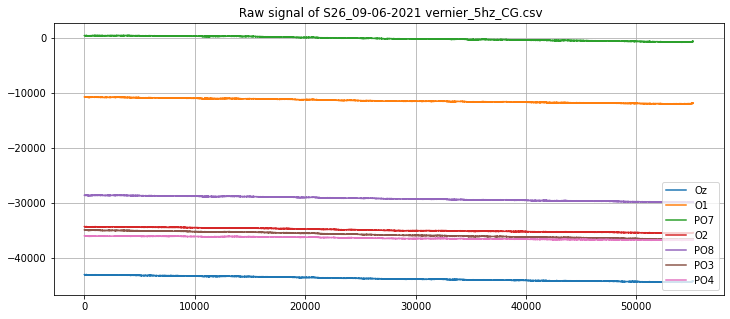

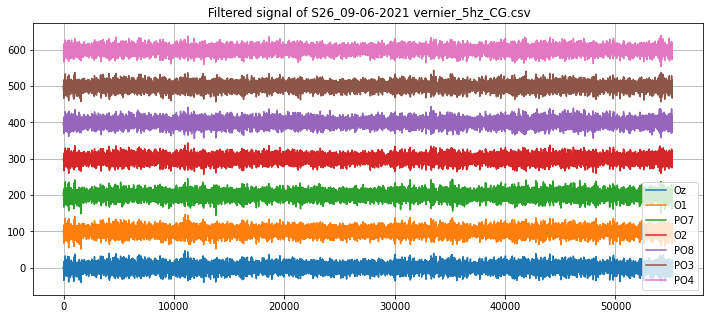

Controles
S33_21-06-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz.csv', 'ajedrez_6hz.csv', 'vernier_5hz.csv', 'vernier_6hz.csv', 'reposo_OA', 'vernier_5hz']
4


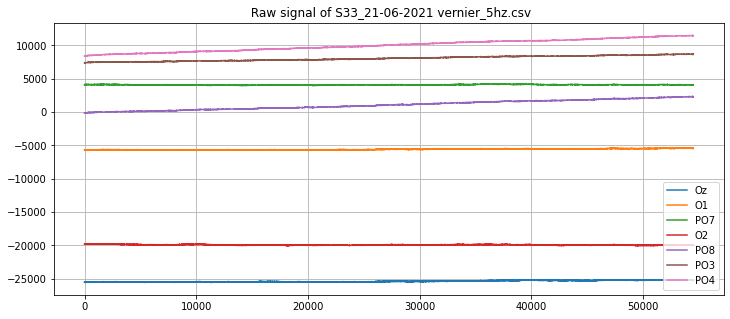

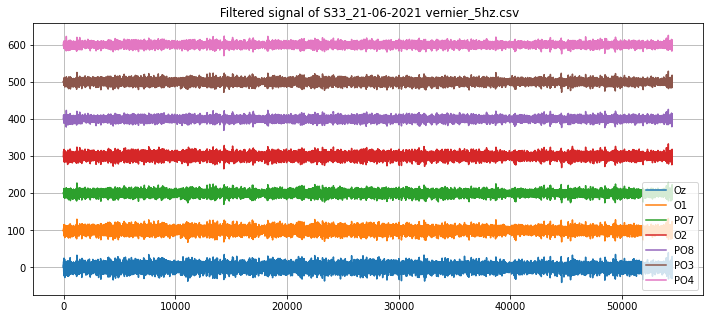

Controles
S39_23-06-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz.csv', 'ajedrez_6hz.csv', 'vernier_5hz.csv', 'vernier_6hz.csv', 'reposo_OA', 'vernier_5hz']
5


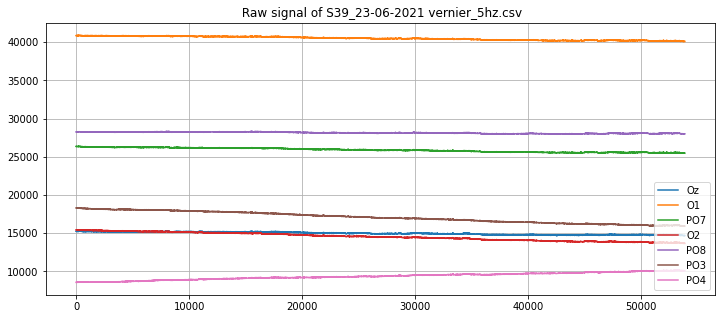

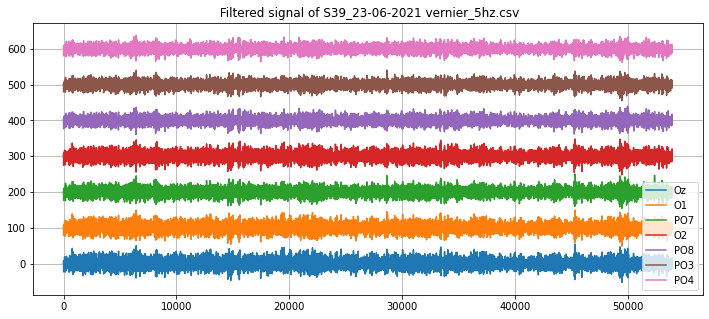

Pacientes
P2_21-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz.csv', 'ajedrez_6hz.csv', 'vernier_5hz.csv', 'vernier_6hz.csv', 'vernier_6hz_2.csv', 'reposo_OA', 'vernier_5hz']


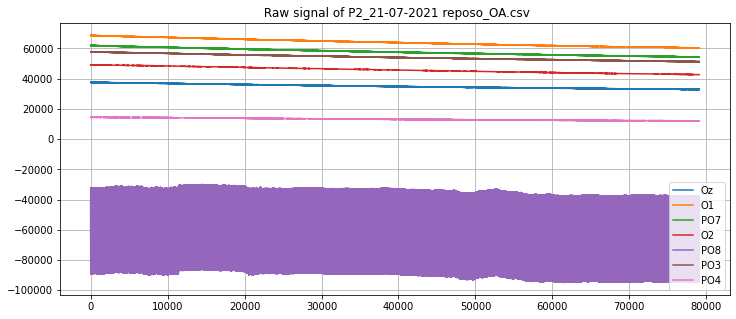

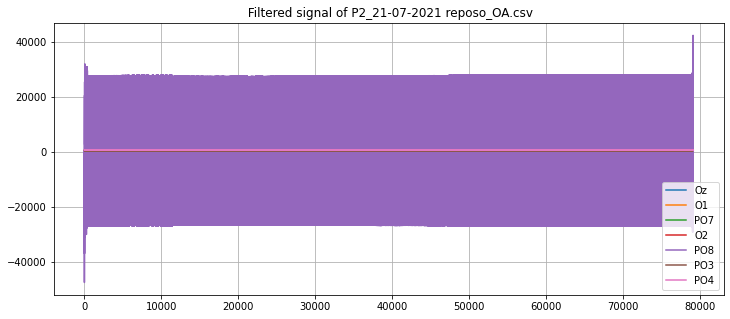

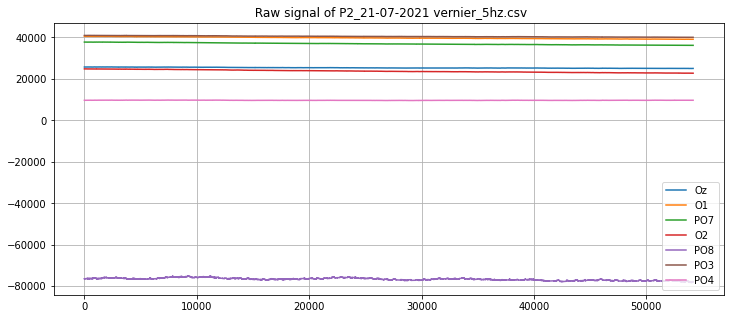

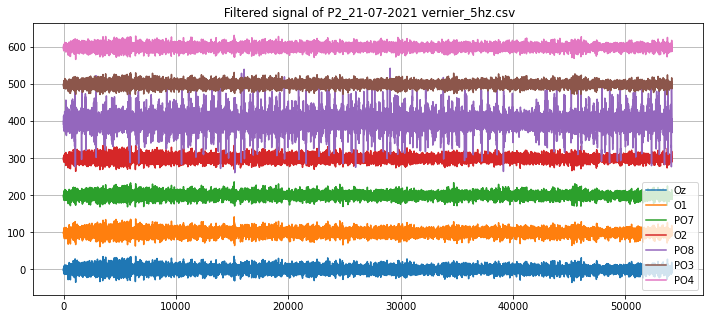

Pacientes
P7_26-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz.csv', 'ajedrez_6hz.csv', 'vernier_5hz.csv', 'vernier_6hz.csv', 'reposo_OA', 'vernier_5hz']


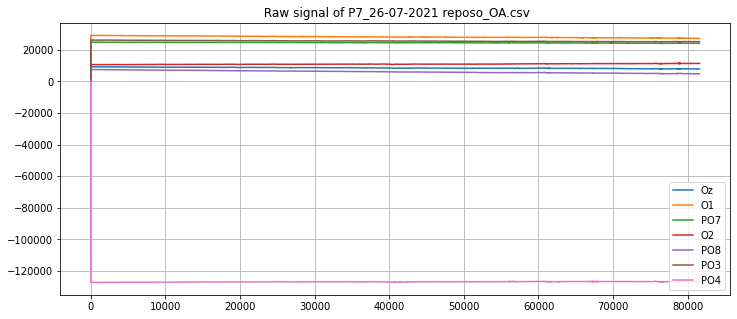

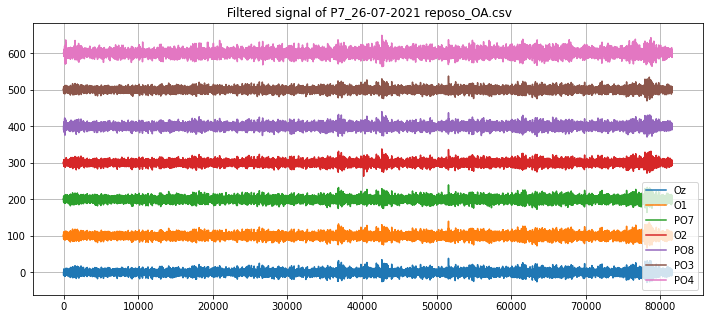

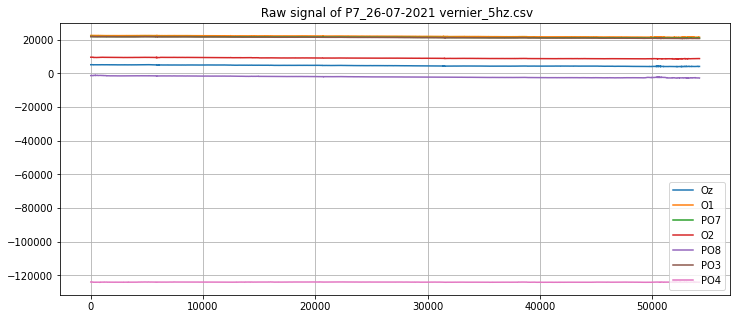

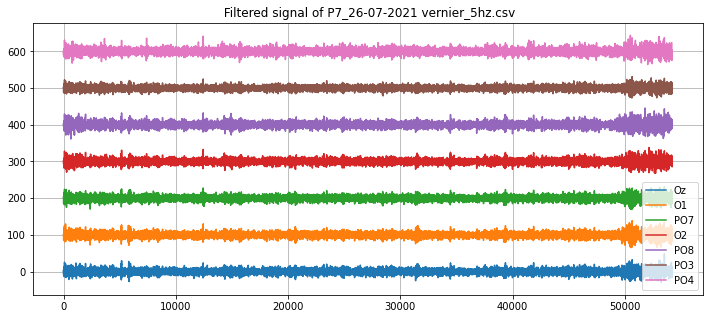

Pacientes
P5_24-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz_SG.csv', 'ajedrez_6hz_SG.csv', 'vernier_5hz_SG.csv', 'vernier_6hz_SG.csv', 'ajedrez_5hz_CG.csv', 'ajedrez_6hz_CG.csv', 'vernier_5hz_CG.csv', 'vernier_6hz_CG.csv', 'reposo_OA', 'vernier_5hz_SG', 'vernier_5hz_CG']


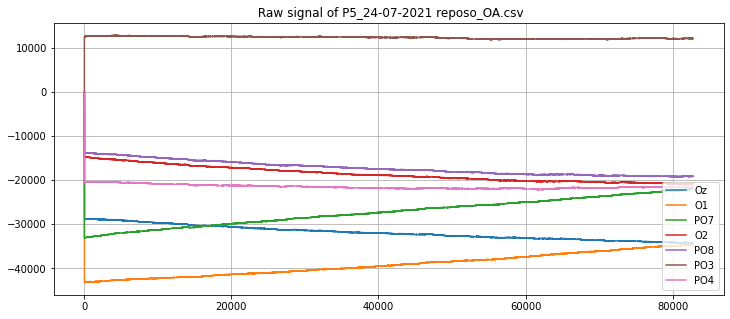

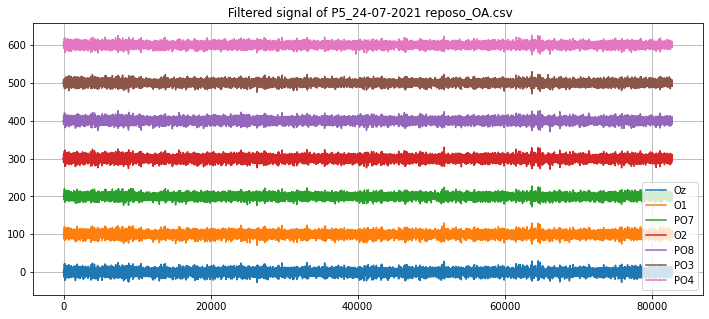

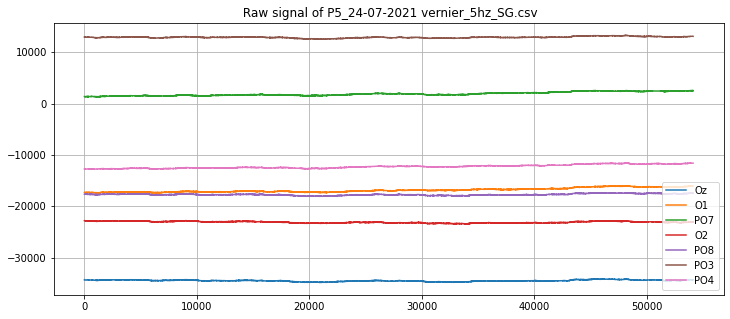

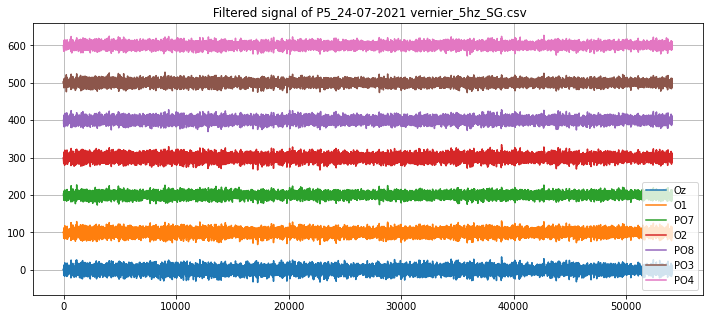

Pacientes
P6_24-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz_SG.csv', 'ajedrez_6hz_SG.csv', 'vernier_5hz_SG.csv', 'vernier_6hz_SG.csv', 'ajedrez_5hz_CG.csv', 'ajedrez_6hz_CG.csv', 'vernier_5hz_CG.csv', 'vernier_6hz_CG.csv', 'reposo_OA', 'vernier_5hz_SG', 'vernier_5hz_CG']


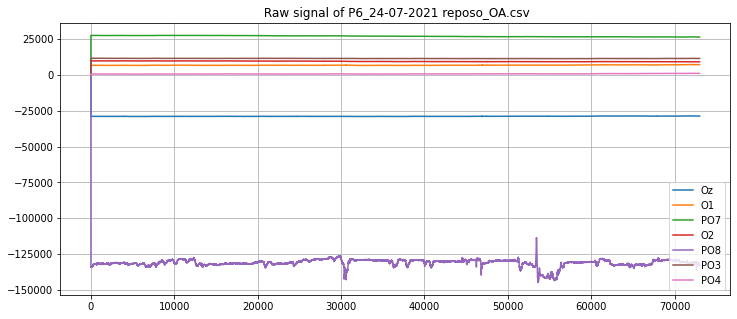

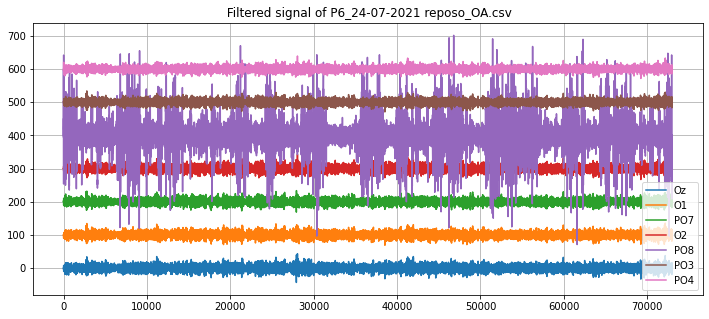

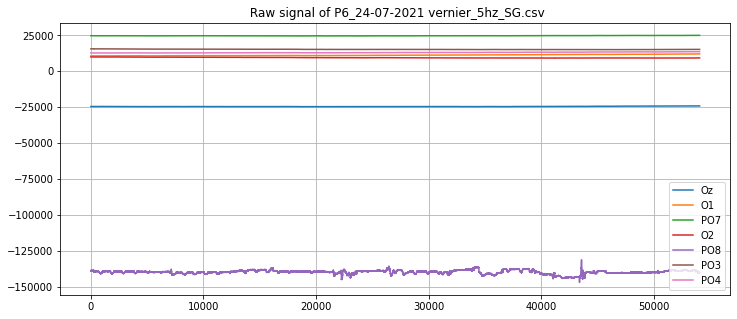

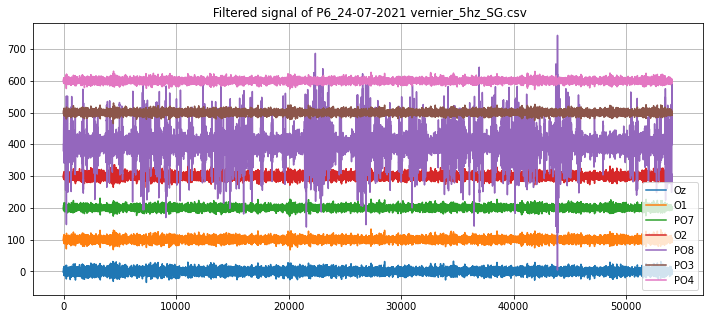

Pacientes
P4_22-07-2021
['reposo_OA.csv', 'reposo_OC.csv', 'ajedrez_5hz.csv', 'ajedrez_6hz.csv', 'vernier_5hz.csv', 'vernier_6hz.csv', 'reposo_OA', 'vernier_5hz']


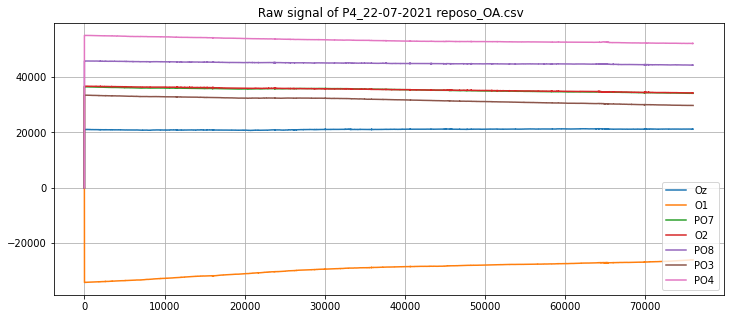

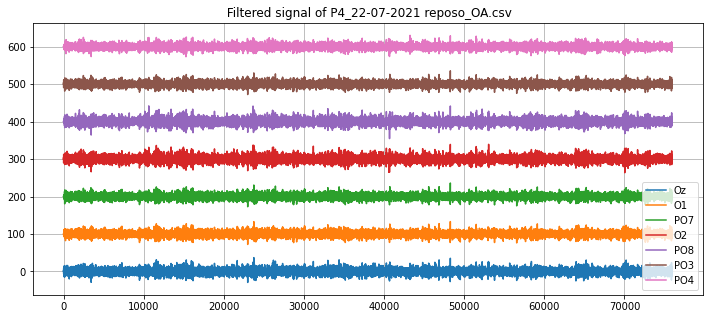

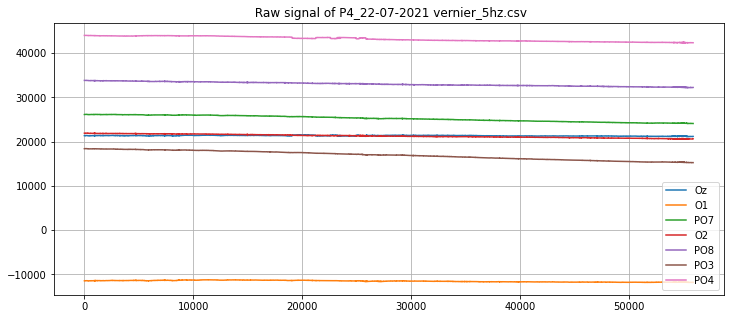

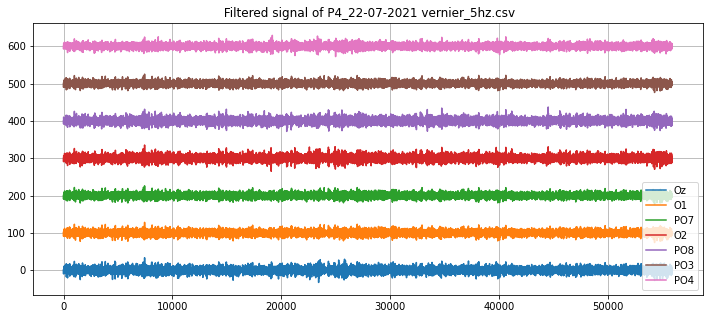

In [ ]:
#Codigo para controles (que tienen gafas)
signals_WSNR = 0
signals_WHarmonic_SNR = 0
SNR_controles = []
SNR_pacientes=[]
reposo_pacientes=[]
pacientes=[]
controles_SG_p=[]
i=0
path=r'/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Registros/Pareados'
for group in os.listdir(path):
  for subject in os.listdir(os.path.join(path, group)):
    print(group)
    print(subject)
    print(os.listdir(os.path.join(path, group, subject)))
    for acuity_signals in os.listdir(os.path.join(path, group, subject)):
      if group=='Controles' and (acuity_signals=="vernier_5hz_CG.csv" or acuity_signals=="vernier_5hz.csv"):
        i=i+1
        print(i)
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        controles_SG_p.append(Pot)
        SNR_controles.append(SNR_subject)
      if group=='Pacientes' and (acuity_signals=="vernier_5hz.csv" or acuity_signals=="vernier_5hz_SG.csv"):
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        pacientes.append(Pot)
        SNR_pacientes.append(SNR_subject)
      
            
      if group=='Pacientes' and acuity_signals=="reposo_OA.csv":
        if os.path.isfile(os.path.join(path, group, subject, acuity_signals)):
          signal_path = os.path.join(path, group, subject, acuity_signals)
          signal_uploaded, marks = signal_upload(signal_path, subject, acuity_signals, electrodes)
          filtered_signal = signal_filtering(signal_uploaded, subject, acuity_signals, electrodes, highpass, lowpass)
          Pot,SNR_counter, harmonics_SNRCounter, SNR_subject  = periodogram(filtered_signal, marks, num_logmars, fs, subject, acuity_signals, signal_path)
        reposo_pacientes.append(Pot)
      
df_reposo_pacientes = pd.DataFrame(reposo_pacientes,columns=np.arange(0,125.5,.5))
df_controles_SG_p = pd.DataFrame(controles_SG_p,columns=np.arange(0,125.5,.5))
df_pacientes=pd.DataFrame(pacientes,columns=np.arange(0,125.5,.5))
df_controles_SG_p.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_SG_pareados_con_pacientes.csv',sep=',',index=False)
df_pacientes.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_pacientes.csv',sep=',',index=False)
df_reposo_pacientes.to_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_reposo_pacientes.csv',sep=',',index=False)

0     19.045117
1     16.191098
2     42.491932
3     28.842061
4    103.651117
Name: 5.0, dtype: float64
0    72.907502
1     7.350069
2    41.562514
3    36.466879
4     4.675174
Name: 5.0, dtype: float64
            W      pval  normal
5.0  0.787454  0.063783    True
            W      pval  normal
5.0  0.915987  0.504392    True
Se obtuvo un estadistico de 6.0 con un valor p de 0.8125


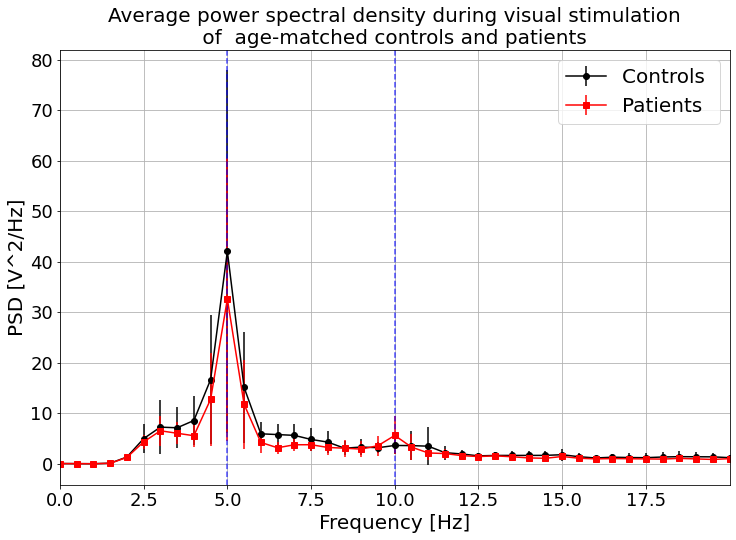

SNR controles 
              0
count  5.000000
mean   2.572623
std    0.684128
min    1.533979
25%    2.507764
50%    2.537968
75%    2.876908
max    3.406498

SNR pacientes
              0
count  5.000000
mean   2.287202
std    0.830558
min    1.157229
25%    1.682427
50%    2.648521
75%    2.827275
max    3.120558


In [ ]:
##iii) Controles  vs neuro-oftalmológicos (prueba t no paramétricas): Perspectivas futuras y en la discusión se indica la limitación 
##para aumentar la muestra. Pareados por edad en lo posible (7 vs 7 en edad y genero)
#Nota los datos a meter en la prueba son df_controles_SG_p['5.0'] y df_pacientes['5.0']

df_controles_SG_p=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_SG_pareados_con_pacientes.csv')
df_pacientes=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_pacientes.csv')
img_path = '/content/drive/MyDrive/Visión Sábados/Controles_pacientes.tiff'
#Resultados prueba
print(df_controles_SG_p['5.0'])
print(df_pacientes['5.0'])
print(pg.normality(data=df_controles_SG_p['5.0']))
print(pg.normality(data=df_pacientes['5.0']))
# Prueba T no paramétrica
# Hipotesis nula: tienen distribuciones iguales
# Se realiza U-mann
from scipy.stats import mannwhitneyu
import io
u,pvalue = wilcoxon(df_controles_SG_p['5.0'], df_pacientes['5.0'])
print(f'Se obtuvo un estadistico de {u} con un valor p de {pvalue}')


#Grafico
controles = df_controles_SG_p.mean(axis = 0).values
pacientes = df_pacientes.mean(axis = 0).values

plt.figure(figsize = (12,8))
plt.xlim([0,40])
plt.xticks(np.arange(0,40,5))
plt.errorbar(df_controles_SG_p.columns, controles ,  xerr=None, yerr=df_controles_SG_p.std(axis = 0).values, color = 'black',marker='o')
plt.errorbar(df_pacientes.columns, pacientes,  xerr=None, yerr=df_pacientes.std(axis = 0).values,  color = 'red',marker='s')
plt.legend(['Controls ','Patients '],fontsize=20)
plt.axvline(10, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)
plt.axvline(20, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)

plt.grid()
plt.xlabel('Frequency [Hz]',fontsize=20)
plt.ylabel('PSD [V^2/Hz]',fontsize=20)
plt.title('Average power spectral density during visual stimulation\n of  age-matched controls and patients ',fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()

#SNR
SNR_controles = pd.DataFrame(SNR_controles)
SNR_pacientes=pd.DataFrame(SNR_pacientes)
print('SNR controles ')
print(SNR_controles.describe())
print('\nSNR pacientes')
print(SNR_pacientes.describe())

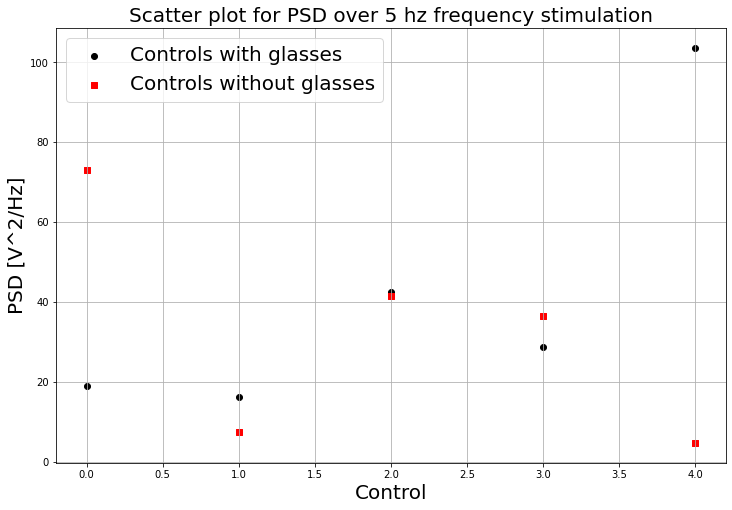

In [ ]:
# Gráficos de dispersión

colors = ['black','red']
g1 = df_controles_SG_p['5.0']
g2 = df_pacientes['5.0']

plt.figure(figsize = (12,8))
plt.scatter(range(len(g1)), g1,marker='o', color='black')
plt.scatter(range(len(g2)), g2, marker='s', c='red')
plt.title('Scatter plot for PSD over 5 hz frequency stimulation', fontsize=20)
plt.legend(['Controls', 'Patients'], fontsize=20)
plt.xlabel('Control', fontsize=20)
plt.ylabel('PSD [V^2/Hz]', fontsize=20)
plt.grid()

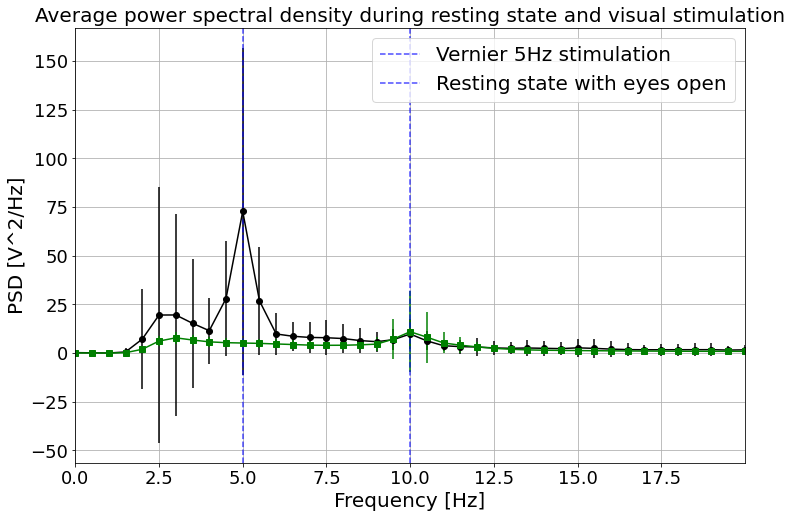

In [ ]:


df_controles_CG=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_controles_CG.csv')
df_reposo_controles=pd.read_csv('/content/drive/MyDrive/Visión Sábados/Entrega Banco de la República/Procesamiento/welch_reposo_controles.csv')

controles = df_controles_CG.mean(axis = 0).values
reposo = df_reposo_controles.mean(axis = 0).values

plt.figure(figsize = (12,8))
plt.xlim([0,40])
plt.xticks(np.arange(0,40,5))
plt.errorbar(df_controles_CG.columns, controles , xerr=None, yerr=df_controles_CG.std(axis = 0).values,  color = 'black',marker='o')
plt.errorbar(df_reposo_controles.columns, reposo,   xerr=None, yerr=df_reposo_controles.std(axis = 0).values, color = 'g',marker='s')
plt.axvline(10, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)
plt.axvline(20, color='b', linewidth = 1.5,  ls = '--', alpha = 0.7)
plt.legend(['Vernier 5Hz stimulation','Resting state with eyes open'],fontsize=20)
plt.grid()
plt.xlabel('Frequency [Hz]',fontsize=20)
plt.ylabel('PSD [V^2/Hz]',fontsize=20)
plt.title('Average power spectral density during resting state and visual stimulation',fontsize=20)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.show()
